In [58]:
import nltk
nltk.download('stopwords')

import numpy as np
import pandas as pd
import os
import re
import matplotlib.pyplot as plt
from nltk.corpus import stopwords
from bs4 import BeautifulSoup 
from tensorflow.keras.preprocessing.text import Tokenizer 
from tensorflow.keras.preprocessing.sequence import pad_sequences
import urllib.request
import warnings
warnings.filterwarnings("ignore", category=UserWarning, module='bs4')

# 인코더 설계
from tensorflow.keras.layers import Input, LSTM, Embedding, Dense, Concatenate, TimeDistributed
from tensorflow.keras.models import Model
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

# 어텐션 메커니즘 추가
from tensorflow.keras.layers import AdditiveAttention

[nltk_data] Downloading package stopwords to /aiffel/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [2]:
# 총 568,454개의 샘플 중 100,000개만 사용
data = pd.read_csv(os.getenv("HOME")+"/aiffel/news_summarization/data/Reviews.csv", nrows=100000)
print('전체 샘플수 :', (len(data)))  # 샘플 확인

전체 샘플수 : 100000


In [3]:
data.head()  # 데이터 잘 불러왔는지 확인

,Id,ProductId,UserId,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Score,Time,Summary,Text
0,1,B001E4KFG0,A3SGXH7AUHU8GW,delmartian,1,1,5,1303862400,Good Quality Dog Food,I have bought several of the Vitality canned d...
1,2,B00813GRG4,A1D87F6ZCVE5NK,dll pa,0,0,1,1346976000,Not as Advertised,Product arrived labeled as Jumbo Salted Peanut...
2,3,B000LQOCH0,ABXLMWJIXXAIN,"Natalia Corres ""Natalia Corres""",1,1,4,1219017600,"""Delight"" says it all",This is a confection that has been around a fe...
3,4,B000UA0QIQ,A395BORC6FGVXV,Karl,3,3,2,1307923200,Cough Medicine,If you are looking for the secret ingredient i...
4,5,B006K2ZZ7K,A1UQRSCLF8GW1T,"Michael D. Bigham ""M. Wassir""",0,0,5,1350777600,Great taffy,Great taffy at a great price. There was a wid...


In [4]:
# 훈련에 사용할 columns만 저장
data = data[['Summary', 'Text']]
data.head()  # 잘 분리되었는지 확인

,Summary,Text
0,Good Quality Dog Food,I have bought several of the Vitality canned d...
1,Not as Advertised,Product arrived labeled as Jumbo Salted Peanut...
2,"""Delight"" says it all",This is a confection that has been around a fe...
3,Cough Medicine,If you are looking for the secret ingredient i...
4,Great taffy,Great taffy at a great price. There was a wid...


In [5]:
# 중복값 확인
print('Text 열에서 중복을 배제한 샘플 수: ', data['Text'].unique())
print('Summary 열에서 중복을 배제한 샘플 수: ', data['Summary'].unique())

Text 열에서 중복을 배제한 샘플 수:  ['I have bought several of the Vitality canned dog food products and have found them all to be of good quality. The product looks more like a stew than a processed meat and it smells better. My Labrador is finicky and she appreciates this product better than  most.'
 'Product arrived labeled as Jumbo Salted Peanuts...the peanuts were actually small sized unsalted. Not sure if this was an error or if the vendor intended to represent the product as "Jumbo".'
 'This is a confection that has been around a few centuries.  It is a light, pillowy citrus gelatin with nuts - in this case Filberts. And it is cut into tiny squares and then liberally coated with powdered sugar.  And it is a tiny mouthful of heaven.  Not too chewy, and very flavorful.  I highly recommend this yummy treat.  If you are familiar with the story of C.S. Lewis\' "The Lion, The Witch, and The Wardrobe" - this is the treat that seduces Edmund into selling out his Brother and Sisters to the Witch.'
 

In [6]:
# duplicate value drop
# inplace=True => 내부적으로 직접 바꿈
data.drop_duplicates(subset = ['Text'], inplace = True)
print('전체 샘플 수: ', len(data))

전체 샘플 수:  88426


In [7]:
# 결측값 확인
print(data.isnull().sum())

Summary    1
Text       0
dtype: int64


In [8]:
# NULL value drop
data.dropna(axis=0, inplace=True)
print('전체 샘플 수: ', len(data))

전체 샘플 수:  88425


In [9]:
# 텍스트 정규화
contractions = {"ain't": "is not", "aren't": "are not","can't": "cannot", "'cause": "because", "could've": "could have", "couldn't": "could not",
                           "didn't": "did not",  "doesn't": "does not", "don't": "do not", "hadn't": "had not", "hasn't": "has not", "haven't": "have not",
                           "he'd": "he would","he'll": "he will", "he's": "he is", "how'd": "how did", "how'd'y": "how do you", "how'll": "how will", "how's": "how is",
                           "I'd": "I would", "I'd've": "I would have", "I'll": "I will", "I'll've": "I will have","I'm": "I am", "I've": "I have", "i'd": "i would",
                           "i'd've": "i would have", "i'll": "i will",  "i'll've": "i will have","i'm": "i am", "i've": "i have", "isn't": "is not", "it'd": "it would",
                           "it'd've": "it would have", "it'll": "it will", "it'll've": "it will have","it's": "it is", "let's": "let us", "ma'am": "madam",
                           "mayn't": "may not", "might've": "might have","mightn't": "might not","mightn't've": "might not have", "must've": "must have",
                           "mustn't": "must not", "mustn't've": "must not have", "needn't": "need not", "needn't've": "need not have","o'clock": "of the clock",
                           "oughtn't": "ought not", "oughtn't've": "ought not have", "shan't": "shall not", "sha'n't": "shall not", "shan't've": "shall not have",
                           "she'd": "she would", "she'd've": "she would have", "she'll": "she will", "she'll've": "she will have", "she's": "she is",
                           "should've": "should have", "shouldn't": "should not", "shouldn't've": "should not have", "so've": "so have","so's": "so as",
                           "this's": "this is","that'd": "that would", "that'd've": "that would have", "that's": "that is", "there'd": "there would",
                           "there'd've": "there would have", "there's": "there is", "here's": "here is","they'd": "they would", "they'd've": "they would have",
                           "they'll": "they will", "they'll've": "they will have", "they're": "they are", "they've": "they have", "to've": "to have",
                           "wasn't": "was not", "we'd": "we would", "we'd've": "we would have", "we'll": "we will", "we'll've": "we will have", "we're": "we are",
                           "we've": "we have", "weren't": "were not", "what'll": "what will", "what'll've": "what will have", "what're": "what are",
                           "what's": "what is", "what've": "what have", "when's": "when is", "when've": "when have", "where'd": "where did", "where's": "where is",
                           "where've": "where have", "who'll": "who will", "who'll've": "who will have", "who's": "who is", "who've": "who have",
                           "why's": "why is", "why've": "why have", "will've": "will have", "won't": "will not", "won't've": "will not have",
                           "would've": "would have", "wouldn't": "would not", "wouldn't've": "would not have", "y'all": "you all",
                           "y'all'd": "you all would","y'all'd've": "you all would have","y'all're": "you all are","y'all've": "you all have",
                           "you'd": "you would", "you'd've": "you would have", "you'll": "you will", "you'll've": "you will have",
                           "you're": "you are", "you've": "you have"}

print("정규화 사전의 수: ", len(contractions))

정규화 사전의 수:  120


In [10]:
# 불용어: 자주 등장하지만 요약하는 데에 별 의미 없는 단어들
print('불용어 개수 :', len(stopwords.words('english') ))
print(stopwords.words('english'))

불용어 개수 : 179
['i', 'me', 'my', 'myself', 'we', 'our', 'ours', 'ourselves', 'you', "you're", "you've", "you'll", "you'd", 'your', 'yours', 'yourself', 'yourselves', 'he', 'him', 'his', 'himself', 'she', "she's", 'her', 'hers', 'herself', 'it', "it's", 'its', 'itself', 'they', 'them', 'their', 'theirs', 'themselves', 'what', 'which', 'who', 'whom', 'this', 'that', "that'll", 'these', 'those', 'am', 'is', 'are', 'was', 'were', 'be', 'been', 'being', 'have', 'has', 'had', 'having', 'do', 'does', 'did', 'doing', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'because', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'during', 'before', 'after', 'above', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'once', 'here', 'there', 'when', 'where', 'why', 'how', 'all', 'any', 'both', 'each', 'few', 'more', 'most', 'other', 'some', 'such', 'no', 'nor', 'not', 'only', 'own', 'same', 's

In [11]:
# 데이터 전처리 함수
def preprocess_sentence(sentence, remove_stopwords=True):
    sentence = sentence.lower() # 텍스트 소문자화
    sentence = BeautifulSoup(sentence, "lxml").text # <br />, <a href = ...> 등의 html 태그 제거
    sentence = re.sub(r'\([^)]*\)', '', sentence) # 괄호로 닫힌 문자열 (...) 제거 Ex) my husband (and myself!) for => my husband for
    sentence = re.sub('"','', sentence) # 쌍따옴표 " 제거
    sentence = ' '.join([contractions[t] if t in contractions else t for t in sentence.split(" ")]) # 약어 정규화
    sentence = re.sub(r"'s\b","", sentence) # 소유격 제거. Ex) roland's -> roland
    sentence = re.sub("[^a-zA-Z]", " ", sentence) # 영어 외 문자(숫자, 특수문자 등) 공백으로 변환
    sentence = re.sub('[m]{2,}', 'mm', sentence) # m이 3개 이상이면 2개로 변경. Ex) ummmmmmm yeah -> umm yeah
    
    # 불용어 제거 (Text)
    if remove_stopwords:
        tokens = ' '.join(word for word in sentence.split() if not word in stopwords.words('english') if len(word) > 1)
    # 불용어 미제거 (Summary)
    else:
        tokens = ' '.join(word for word in sentence.split() if len(word) > 1)
    return tokens

In [12]:
# 전처리 함수 적용 전/후 확인
temp_text = 'Everything I bought was great, infact I ordered twice and the third ordered was<br />for my mother and father.'
temp_summary = 'Great way to start (or finish) the day!!!'

print("text: ", preprocess_sentence(temp_text))  # I, was, the 등 불용어 제거
print("summary:", preprocess_sentence(temp_summary, False))  # 불용어 제거x

text:  everything bought great infact ordered twice third ordered wasfor mother father
summary: great way to start the day


In [13]:
# 전체 Text 데이터에 대한 전처리 : 10분 이상 소요
clean_text = []

for text in data['Text']:
    processed_text = preprocess_sentence(text)  # 불용어 제거
    clean_text.append(processed_text)

# 전처리 후 출력
print("Text 전처리 후 결과: ", clean_text[:5])

Text 전처리 후 결과:  ['bought several vitality canned dog food products found good quality product looks like stew processed meat smells better labrador finicky appreciates product better', 'product arrived labeled jumbo salted peanuts peanuts actually small sized unsalted sure error vendor intended represent product jumbo', 'confection around centuries light pillowy citrus gelatin nuts case filberts cut tiny squares liberally coated powdered sugar tiny mouthful heaven chewy flavorful highly recommend yummy treat familiar story lewis lion witch wardrobe treat seduces edmund selling brother sisters witch', 'looking secret ingredient robitussin believe found got addition root beer extract ordered made cherry soda flavor medicinal', 'great taffy great price wide assortment yummy taffy delivery quick taffy lover deal']


In [14]:
# 전체 Summary 데이터에 대한 전처리 : 5분 이상 소요
clean_summary = []

for summary in data['Summary']:
    processed_summary = preprocess_sentence(summary, remove_stopwords=False)  # 불용어 제거를 수행하지 않음
    clean_summary.append(processed_summary)

print("Summary 전처리 후 결과: ", clean_summary[:5])

Summary 전처리 후 결과:  ['good quality dog food', 'not as advertised', 'delight says it all', 'cough medicine', 'great taffy']


In [15]:
# data에 덮어씌운 후 NULL값 확인 및 처리
data['Text'] = clean_text
data['Summary'] = clean_summary

In [16]:
# 빈 값을 Null 값으로 변환
data.replace('', np.nan, inplace=True)
print(data.isnull().sum())

In [17]:
data.dropna(axis=0, inplace=True)
print('전체 샘플수 :', (len(data)))

전체 샘플수 : 88355


In [18]:
# 샘플의 최대 길이를 정하기 위해 데이터 시각화, 길이 분포 출력
text_len = [len(s.split()) for s in data['Text']]
summary_len = [len(s.split()) for s in data['Summary']]

print('텍스트의 최소 길이 : {}'.format(np.min(text_len)))
print('텍스트의 최대 길이 : {}'.format(np.max(text_len)))
print('텍스트의 평균 길이 : {}'.format(np.mean(text_len)))
print('요약의 최소 길이 : {}'.format(np.min(summary_len)))
print('요약의 최대 길이 : {}'.format(np.max(summary_len)))
print('요약의 평균 길이 : {}'.format(np.mean(summary_len)))

텍스트의 최소 길이 : 2
텍스트의 최대 길이 : 1235
텍스트의 평균 길이 : 38.792428272310566
요약의 최소 길이 : 1
요약의 최대 길이 : 28
요약의 평균 길이 : 4.010729443721352


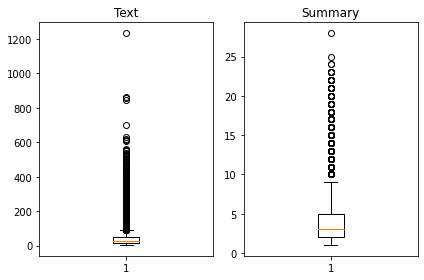

In [19]:
plt.subplot(1,2,1)
plt.boxplot(text_len)
plt.title('Text')
plt.subplot(1,2,2)
plt.boxplot(summary_len)
plt.title('Summary')
plt.tight_layout()
plt.show()

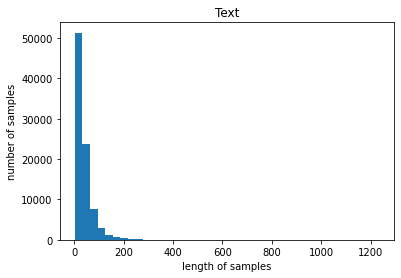

In [20]:
plt.title('Text')
plt.hist(text_len, bins = 40)
plt.xlabel('length of samples')
plt.ylabel('number of samples')
plt.show()

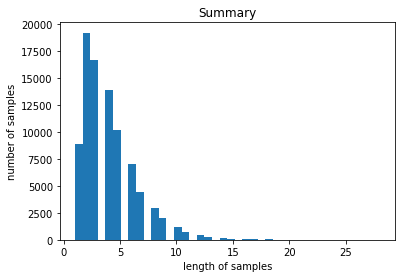

In [21]:
plt.title('Summary')
plt.hist(summary_len, bins = 40)
plt.xlabel('length of samples')
plt.ylabel('number of samples')
plt.show()

In [22]:
# 임의로 정하기
text_max_len = 50
summary_max_len = 8

In [28]:
# 훈련데이터와 샘플의 길이를 입력하면, 
# 데이터의 몇 %가 해당하는지 계산하는 함수를 만들어서 정확하게 판단해보자
def below_threshold_len(max_len, nested_list):
    cnt = 0
    for s in nested_list:
        if(len(s.split()) <= max_len):
            cnt = cnt + 1
    print('전체 샘플 중 길이가 %s 이하인 샘플의 비율: %s'%(max_len, (cnt / len(nested_list))))

In [29]:
# 함수 적용
below_threshold_len(text_max_len, data['Text'])
below_threshold_len(summary_max_len,  data['Summary'])

전체 샘플 중 길이가 50 이하인 샘플의 비율: 1.1317978609020428e-05
전체 샘플 중 길이가 50 이하인 샘플의 비율: 2.2635957218040857e-05
전체 샘플 중 길이가 50 이하인 샘플의 비율: 3.395393582706129e-05
전체 샘플 중 길이가 50 이하인 샘플의 비율: 4.5271914436081714e-05
전체 샘플 중 길이가 50 이하인 샘플의 비율: 5.6589893045102146e-05
전체 샘플 중 길이가 50 이하인 샘플의 비율: 6.790787165412258e-05
전체 샘플 중 길이가 50 이하인 샘플의 비율: 7.9225850263143e-05
전체 샘플 중 길이가 50 이하인 샘플의 비율: 9.054382887216343e-05
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.00010186180748118387
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.00011317978609020429
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.00011317978609020429
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.00012449776469922473
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.00013581574330824515
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.00014713372191726558
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.000158451700526286
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.00016976967913530643
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.00018108765774432685
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.00019240563635334728
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.00019240563635334728
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.00020372361496236773
전체 샘플 중 

전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.02243223360307849
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.02244355158168751
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.02245486956029653
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.02246618753890555
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.02247750551751457
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.02248882349612359
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.022500141474732612
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.022511459453341633
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.022522777431950653
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.022534095410559674
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.022545413389168694
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.022556731367777715
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.022568049346386735
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.022579367324995755
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.022590685303604776
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.022602003282213796
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.022613321260822817
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.022624639239431837
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.022635957218040858
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.02264727519664988
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.0226585931752589
전

전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.03690792824401562
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.03691924622262464
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.03693056420123366
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.03694188217984268
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.0369532001584517
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.03696451813706072
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.03697583611566974
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.03698715409427876
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.036998472072887784
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.036998472072887784
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.0370097900514968
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.037021108030105825
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.03703242600871484
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.037043743987323866
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.03705506196593288
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.037066379944541906
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.037066379944541906
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.037077697923150923
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.03708901590175995
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.037100333880368964
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.037100333880368964
전체 샘플 

전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.05507328391149341
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.055084601890102426
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.055084601890102426
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.05509591986871145
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.05510723784732047
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.05511855582592949
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.05512987380453851
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.05514119178314753
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.05514119178314753
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.05514119178314753
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.05515250976175655
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.05516382774036557
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.05516382774036557
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.05517514571897459
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.055186463697583614
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.05519778167619263
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.055209099654801655
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.05522041763341067
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.055231735612019696
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.055231735612019696
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.05524305359062871
전체 샘플 중

전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.07450625318318148
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.0745175711617905
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.07452888914039953
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.07452888914039953
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.07454020711900855
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.07455152509761756
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.07456284307622658
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.07457416105483561
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.07458547903344463
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.07459679701205364
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.07460811499066267
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.07460811499066267
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.07460811499066267
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.07461943296927169
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.07463075094788071
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.07463075094788071
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.07464206892648972
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.07465338690509875
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.07466470488370777
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.0746760228623168
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.0746873408409258
전체 샘플 중 길이가 50 이

전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.09056646482938147
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.09057778280799049
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.09058910078659951
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.09060041876520854
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.09061173674381755
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.09062305472242657
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.0906343727010356
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.09064569067964462
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.09065700865825363
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.09065700865825363
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.09066832663686265
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.09067964461547168
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.0906909625940807
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.09070228057268971
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.09070228057268971
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.09071359855129874
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.09072491652990776
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.09073623450851678
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.09073623450851678
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.0907475524871258
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.0907475524871258
전체 샘플 중 길이가 50 이하

전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.11090487238979119
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.1109161903684002
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.11092750834700922
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.11092750834700922
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.11092750834700922
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.11093882632561824
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.11095014430422727
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.11096146228283628
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.1109727802614453
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.11098409824005433
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.11099541621866335
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.11100673419727236
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.11101805217588138
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.11102937015449041
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.11102937015449041
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.11104068813309943
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.11104068813309943
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.11105200611170844
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.11106332409031747
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.11107464206892649
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.11108596004753551
전체 샘플 중 길이가 50 

전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.12876464263482543
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.12877596061343444
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.12878727859204347
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.12879859657065248
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.1288099145492615
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.12882123252787053
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.12883255050647954
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.12884386848508855
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.1288551864636976
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.1288665044423066
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.1288778224209156
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.12888914039952465
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.12890045837813366
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.1289117763567427
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.1289230943353517
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.12893441231396072
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.12894573029256975
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.12895704827117876
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.12896836624978777
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.1289796842283968
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.12899100220700582
전체 샘플 중 길이가 50 이하인 샘

전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.1479825703129421
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.14799388829155113
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.14799388829155113
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.14799388829155113
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.14800520627016014
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.14801652424876918
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.1480278422273782
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.1480391602059872
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.14805047818459624
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.14806179616320525
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.14807311414181426
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.1480844321204233
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.1480844321204233
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.1480957500990323
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.14810706807764135
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.14811838605625036
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.14812970403485937
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.1481410220134684
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.14815233999207741
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.14816365797068642
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.14817497594929546
전체 샘플 중 길이가 50 이하인 샘

전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.16477845056872842
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.16478976854733746
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.16478976854733746
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.16478976854733746
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.16478976854733746
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.16480108652594647
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.16480108652594647
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.16480108652594647
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.16481240450455548
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.16482372248316451
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.16482372248316451
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.16482372248316451
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.16482372248316451
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.16482372248316451
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.16482372248316451
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.16482372248316451
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.16483504046177352
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.16483504046177352
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.16483504046177352
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.16484635844038253
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.16485767641899157
전체 샘플 중 길이가 5

전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.183928470375191
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.1839397883538
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.18395110633240902
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.18396242431101806
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.18397374228962707
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.1839850602682361
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.18399637824684512
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.18400769622545413
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.18401901420406316
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.18403033218267217
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.18404165016128118
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.18405296813989022
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.18406428611849923
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.18407560409710827
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.18408692207571728
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.1840982400543263
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.18410955803293533
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.18412087601154434
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.18413219399015335
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.18413219399015335
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.18413219399015335
전체 샘플 중 길이가 50 이하인 샘플

전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.19849470884500028
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.19849470884500028
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.19849470884500028
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.1985060268236093
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.19851734480221833
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.19852866278082734
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.19853998075943635
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.1985512987380454
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.1985626167166544
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.19857393469526344
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.19858525267387245
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.19859657065248146
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.19859657065248146
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.19859657065248146
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.19859657065248146
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.19859657065248146
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.1986078886310905
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.1986192066096995
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.1986192066096995
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.19863052458830852
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.19863052458830852
전체 샘플 중 길이가 50 이하인 

전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.21879916246958292
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.21881048044819196
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.21882179842680097
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.21883311640541
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.21884443438401902
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.21885575236262803
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.21886707034123706
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.21887838831984607
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.21888970629845508
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.21888970629845508
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.21890102427706412
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.21891234225567313
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.21892366023428217
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.21893497821289118
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.2189462961915002
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.21895761417010923
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.21896893214871824
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.21896893214871824
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.21896893214871824
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.21898025012732725
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.21899156810593629
전체 샘플 중 길이가 50 이하

전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.2381642238696169
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.2381755418482259
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.2381755418482259
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.2381755418482259
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.23818685982683493
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.23819817780544394
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.23820949578405295
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.238220813762662
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.238232131741271
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.23824344971988004
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.23825476769848905
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.23826608567709806
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.2382774036557071
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.2382887216343161
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.23830003961292512
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.23831135759153416
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.23832267557014317
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.2383339935487522
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.2383339935487522
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.23834531152736121
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.23835662950597022
전체 샘플 중 길이가 50 이하인 샘플의 비율

전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.2582196819648011
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.2582309999434101
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.2582423179220191
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.25825363590062816
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.25825363590062816
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.25825363590062816
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.25826495387923715
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.2582762718578462
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.2582875898364552
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.2582989078150642
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.25831022579367324
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.2583215437722823
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.2583328617508913
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.2583441797295003
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.25835549770810934
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.2583668156867184
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.2583668156867184
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.25837813366532736
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.2583894516439364
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.25840076962254543
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.2584120876011544
전체 샘플 중 길이가 50 이하인 샘플의 비율:

전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.276996208477166
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.277007526455775
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.277007526455775
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.277007526455775
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.277007526455775
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.277018844434384
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.277018844434384
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.277018844434384
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.277018844434384
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.277018844434384
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.277018844434384
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.277018844434384
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.27703016241299305
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.27704148039160204
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.27704148039160204
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.27704148039160204
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.27704148039160204
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.27704148039160204
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.27704148039160204
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.2770527983702111
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.2770641163488201
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.2770754343

전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.295863278818403
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.29587459679701206
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.2958859147756211
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.2958972327542301
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.2959085507328391
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.29591986871144815
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.29591986871144815
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.29593118669005714
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.2959425046686662
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.2959425046686662
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.2959538226472752
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.2959651406258842
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.2959651406258842
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.29597645860449323
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.29597645860449323
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.29597645860449323
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.29598777658310227
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.29599909456171125
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.29599909456171125
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.29599909456171125
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.2960104125403203
전체 샘플 중 길이가 50 이하인 샘플의 비

전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.3125686152453172
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.3125799332239262
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.3125912512025352
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.31260256918114426
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.31261388715975325
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.3126252051383623
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.3126365231169713
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.3126478410955803
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.3126478410955803
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.31265915907418934
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.3126704770527984
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.3126704770527984
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.3126817950314074
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.3126931130100164
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.3126931130100164
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.31270443098862544
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.3127157489672345
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.31272706694584346
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.3127383849244525
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.31274970290306153
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.3127610208816705
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0

전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.32994171241016357
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.32995303038877255
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.3299643483673816
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.3299643483673816
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.3299756663459906
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.3299756663459906
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.3299869843245996
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.32999830230320865
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.3300096202818177
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.33002093826042667
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.3300322562390357
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.33004357421764474
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.3300548921962537
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.33006621017486276
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.3300775281534718
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.3300775281534718
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.33008884613208084
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.3301001641106898
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.33011148208929886
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.3301228000679079
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.3301341180465169
전체 샘플 중 길이가 50 이하인 샘플의 비율:

전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.3472016297889197
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.3472129477675287
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.34722426574613774
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.34722426574613774
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.34722426574613774
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.3472355837247468
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.34724690170335576
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.3472582196819648
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.3472582196819648
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.34726953766057383
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.3472808556391828
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.34729217361779186
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.3473034915964009
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.3473034915964009
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.34731480957500993
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.3473261275536189
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.3473261275536189
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.3473261275536189
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.3473261275536189
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.3473261275536189
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.3473261275536189
전체 샘플 중 길이가 50 이하인 샘플의 비율: 

전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.36312602569181146
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.36312602569181146
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.36313734367042044
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.36313734367042044
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.36313734367042044
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.3631486616490295
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.3631599796276385
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.3631712976062475
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.36318261558485654
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.3631939335634656
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.3631939335634656
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.3631939335634656
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.36320525154207456
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.3632165695206836
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.36322788749929263
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.36323920547790167
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.36325052345651065
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.36325052345651065
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.3632618414351197
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.3632618414351197
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.36327315941372873
전체 샘플 중 길이가 50 이하인 샘플의

전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.38655424141248373
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.3865655593910928
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.38657687736970175
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.3865881953483108
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.38659951332691983
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.3866108313055288
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.38662214928413785
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.3866334672627469
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.38664478524135587
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.3866561032199649
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.38666742119857395
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.38667873917718293
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.38669005715579197
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.386701375134401
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.38671269311301004
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.386724011091619
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.38673532907022806
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.3867466470488371
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.3867466470488371
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.3867579650274461
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.3867692830060551
전체 샘플 중 길이가 50 이하인 샘플의 비율:

전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.407198234395337
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.407209552373946
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.40722087035255505
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.40723218833116404
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.4072435063097731
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.4072548242883821
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.4072661422669911
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.40727746024560013
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.40728877822420917
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.40728877822420917
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.40730009620281815
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.4073114141814272
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.4073227321600362
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.40733405013864527
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.40734536811725425
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.40734536811725425
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.40734536811725425
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.4073566860958633
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.4073566860958633
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.4073680040744723
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.4073793220530813
전체 샘플 중 길이가 50 이하인 샘플의 비율:

전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.4251032765548073
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.4251145945334163
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.42512591251202536
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.4251372304906344
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.4251485484692434
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.4251485484692434
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.4251598664478524
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.42517118442646146
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.42517118442646146
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.42518250240507044
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.4251938203836795
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.4252051383622885
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.4252164563408975
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.42522777431950654
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.4252390922981156
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.42525041027672456
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.4252617282553336
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.42527304623394263
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.42527304623394263
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.42527304623394263
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.4252843642125516
전체 샘플 중 길이가 50 이하인 샘플의 비율

전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.4457699054948786
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.44578122347348764
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.44578122347348764
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.44578122347348764
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.44578122347348764
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.44578122347348764
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.44578122347348764
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.4457925414520967
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.44580385943070566
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.44580385943070566
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.4458151774093147
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.4458151774093147
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.44582649538792374
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.4458378133665327
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.44584913134514176
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.44584913134514176
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.4458604493237508
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.4458717673023598
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.4458830852809688
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.4458830852809688
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.4458830852809688
전체 샘플 중 길이가 50 이하인 샘플의 

전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.4594307056759663
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.4594420236545753
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.4594533416331843
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.45946465961179334
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.4594759775904024
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.45948729556901136
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.4594986135476204
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.45950993152622943
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.4595212495048384
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.45953256748344745
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.45953256748344745
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.45953256748344745
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.4595438854620565
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.45955520344066547
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.4595665214192745
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.45957783939788355
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.4595891573764926
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.45960047535510157
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.4596117933337106
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.4596117933337106
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.45962311131231964
전체 샘플 중 길이가 50 이하인 샘플의 비

전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.47936166600645125
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.4793729839850603
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.47938430196366927
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.4793956199422783
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.47940693792088734
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.4794182558994963
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.4794182558994963
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.47942957387810536
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.4794408918567144
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.4794408918567144
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.4794522098353234
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.4794635278139324
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.47947484579254146
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.4794861637711505
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.4794974817497595
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.4795087997283685
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.47952011770697756
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.47953143568558654
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.4795427536641956
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.4795540716428046
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.4795653896214136
전체 샘플 중 길이가 50 이하인 샘플의 비율: 

전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.4957500990323128
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.49576141701092186
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.49576141701092186
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.4957727349895309
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.4957840529681399
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.4957953709467489
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.49580668892535795
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.49581800690396693
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.495829324882576
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.495840642861185
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.495851960839794
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.49586327881840303
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.49587459679701207
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.49588591477562105
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.4958972327542301
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.4959085507328391
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.4959198687114481
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.49593118669005715
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.4959425046686662
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.4959425046686662
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.4959538226472752
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.

전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.5138815007639636
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.5138928187425725
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.5139041367211816
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.5139154546997906
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.5139267726783996
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.5139380906570087
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.5139494086356177
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.5139607266142266
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.5139720445928357
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.5139720445928357
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.5139720445928357
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.5139833625714447
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.5139833625714447
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.5139946805500537
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.5140059985286628
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.5140059985286628
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.5140173165072718
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.5140286344858809
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.5140399524644899
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.5140512704430988
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.5140625884217079
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.51407

전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.5288438684850886
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.5288551864636976
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.5288665044423067
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.5288778224209156
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.5288891403995246
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.5289004583781337
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.5289117763567427
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.5289230943353517
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.5289344123139608
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.5289457302925697
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.5289457302925697
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.5289457302925697
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.5289457302925697
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.5289570482711787
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.5289683662497878
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.5289796842283968
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.5289910022070058
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.5290023201856149
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.5290023201856149
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.5290136381642239
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.5290249561428328
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.52903

전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.5469299983023032
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.5469413162809122
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.5469526342595212
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.5469639522381303
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.5469752702167393
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.5469865881953483
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.5469865881953483
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.5469979061739574
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.5470092241525664
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.5470092241525664
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.5470205421311753
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.5470318601097844
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.5470431780883934
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.5470544960670024
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.5470544960670024
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.5470658140456115
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.5470771320242205
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.5470771320242205
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.5470884500028295
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.5470997679814386
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.5470997679814386
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.54709

전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.5663856035312094
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.5663969215098184
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.5664082394884273
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.5664195574670364
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.5664195574670364
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.5664308754456454
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.5664308754456454
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.5664421934242544
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.5664535114028635
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.5664648293814725
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.5664648293814725
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.5664648293814725
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.5664761473600815
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.5664874653386905
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.5664874653386905
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.5664874653386905
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.5664874653386905
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.5664987833172995
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.5664987833172995
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.5665101012959085
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.5665214192745176
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.56652

전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.5839963782468451
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.5840076962254541
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.5840190142040631
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.5840303321826722
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.5840416501612812
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.5840529681398902
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.5840642861184993
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.5840756040971082
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.5840869220757173
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.5840982400543263
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.5841095580329353
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.5841208760115444
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.5841321939901534
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.5841435119687624
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.5841548299473714
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.5841661479259804
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.5841774659045894
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.5841887838831985
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.5842001018618075
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.5842114198404165
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.5842114198404165
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.58421

전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.5998189123422557
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.5998302303208647
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.5998415482994737
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.5998528662780828
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.5998641842566917
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.5998755022353007
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.5998868202139098
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.5998981381925188
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.5999094561711278
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.5999094561711278
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.5999207741497369
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.5999320921283459
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.5999434101069548
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.5999434101069548
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.5999547280855639
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.5999547280855639
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.5999660460641729
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.599977364042782
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.599988682021391
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.6
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.6000113179786091
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.600022635957218
전체 샘플 

전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.6176786825872899
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.617690000565899
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.6177013185445079
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.6177126365231169
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.617723954501726
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.617735272480335
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.617746590458944
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.6177579084375531
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.617769226416162
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.6177805443947711
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.6177918623733801
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.6178031803519891
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.6178144983305982
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.6178258163092072
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.6178371342878162
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.6178484522664253
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.6178597702450342
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.6178710882236432
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.6178710882236432
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.6178710882236432
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.6178824062022523
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.6178937241

전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.6358779921905947
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.6358893101692038
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.6359006281478128
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.6359119461264218
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.6359232641050309
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.6359232641050309
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.6359345820836398
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.6359459000622489
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.6359572180408579
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.6359685360194669
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.6359685360194669
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.635979853998076
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.635991171976685
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.635991171976685
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.636002489955294
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.636013807933903
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.636013807933903
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.636025125912512
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.636036443891121
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.6360477618697301
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.6360590798483391
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.6360703978269

전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.6544168411521702
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.6544281591307792
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.6544394771093882
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.6544507950879973
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.6544621130666063
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.6544734310452153
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.6544847490238244
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.6544960670024333
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.6545073849810424
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.6545187029596514
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.6545187029596514
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.6545300209382604
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.6545413389168695
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.6545526568954785
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.6545526568954785
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.6545639748740875
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.6545752928526966
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.6545866108313055
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.6545979288099145
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.6546092467885236
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.6546205647671326
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.65463

전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.6776300152792711
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.6776413332578801
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.6776526512364892
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.6776639692150982
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.6776752871937072
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.6776866051723163
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.6776866051723163
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.6776979231509253
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.6777092411295342
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.6777205591081433
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.6777318770867523
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.6777318770867523
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.6777431950653613
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.6777431950653613
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.6777545130439704
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.6777658310225794
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.6777771490011884
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.6777884669797974
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.6777997849584064
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.6778111029370154
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.6778224209156245
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.67782

전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.6909965480165242
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.6910078659951333
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.6910191839737423
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.6910305019523513
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.6910418199309604
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.6910531379095693
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.6910644558881783
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.6910757738667874
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.6910870918453964
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.6910984098240054
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.6911097278026145
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.6911210457812235
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.6911323637598324
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.6911436817384415
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.6911549997170505
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.6911663176956595
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.6911776356742686
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.6911889536528776
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.6912002716314866
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.6912115896100957
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.6912229075887046
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.69123

전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.7066379944541905
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.7066493124327995
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.7066606304114085
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.7066719483900176
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.7066832663686266
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.7066945843472355
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.7067059023258446
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.7067172203044536
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.7067172203044536
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.7067285382830626
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.7067398562616717
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.7067511742402807
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.7067624922188898
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.7067738101974987
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.7067851281761077
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.7067851281761077
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.7067964461547168
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.7068077641333258
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.7068190821119348
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.7068304000905439
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.7068304000905439
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.70684

전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.7260822817044876
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.7260822817044876
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.7260822817044876
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.7260822817044876
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.7260822817044876
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.7260822817044876
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.7260822817044876
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.7260935996830966
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.7261049176617056
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.7261049176617056
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.7261049176617056
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.7261049176617056
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.7261162356403147
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.7261162356403147
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.7261275536189237
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.7261275536189237
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.7261275536189237
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.7261388715975327
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.7261501895761417
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.7261615075547507
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.7261615075547507
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.72617

전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.7419500877143342
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.7419614056929432
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.7419727236715523
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.7419840416501613
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.7419840416501613
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.7419840416501613
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.7419953596287703
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.7420066776073794
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.7420179955859884
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.7420293135645973
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.7420406315432064
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.7420519495218154
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.7420519495218154
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.7420519495218154
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.7420519495218154
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.7420632675004244
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.7420745854790335
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.7420745854790335
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.7420859034576425
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.7420972214362515
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.7421085394148605
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.74211

전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.7598438118951956
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.7598551298738045
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.7598664478524135
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.7598777658310226
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.7598890838096316
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.7599004017882406
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.7599117197668497
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.7599230377454587
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.7599343557240676
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.7599343557240676
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.7599456737026767
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.7599569916812857
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.7599569916812857
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.7599683096598947
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.7599796276385038
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.7599909456171128
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.7600022635957218
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.7600135815743309
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.7600248995529398
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.7600362175315488
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.7600475355101579
전체 샘플 중 길이가 50 이하인 샘플의 비율: 0.76005

전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.00029426744383453116
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.0003055854224435516
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.000316903401052572
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.00032822137966159243
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.00033953935827061286
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.0003508573368796333
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.0003621753154886537
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.00037349329409767413
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.00038481127270669456
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.00039612925131571504
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.00040744722992473546
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.0004187652085337559
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.0004187652085337559
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.0004300831871427763
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.00044140116575179674
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.00045271914436081716
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.0004640371229698376
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.000475355101578858
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.00048667308018787844
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.0004979910587968989
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.0004

전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.026325618244581517
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.026336936223190537
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.026348254201799558
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.026359572180408578
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.0263708901590176
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.02638220813762662
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.02639352611623564
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.02640484409484466
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.02641616207345368
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.0264274800520627
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.02643879803067172
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.02643879803067172
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.026450116009280742
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.026461433987889763
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.026472751966498783
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.026484069945107803
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.026495387923716824
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.026495387923716824
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.026506705902325844
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.026518023880934865
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.026529341859543885
전체 샘플 중 길이가 8 이하인 샘플의 비

전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.04951615641446438
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.049527474393073395
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.04953879237168242
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.04953879237168242
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.049550110350291436
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.04956142832890046
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.04957274630750948
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.0495840642861185
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.04959538226472752
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.04960670024333654
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.04961801822194556
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.04962933620055458
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.0496406541791636
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.049651972157772624
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.04966329013638164
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.049674608114990665
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.04968592609359968
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.049697244072208706
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.04970856205081772
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.04971988002942675
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.049731198008035764
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.04

전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.07207288778224209
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.07208420576085112
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.07209552373946013
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.07210684171806915
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.07211815969667817
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.0721294776752872
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.07214079565389621
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.07215211363250523
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.07216343161111426
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.07216343161111426
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.07217474958972328
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.07218606756833229
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.07219738554694131
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.07220870352555034
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.07222002150415936
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.07223133948276837
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.0722426574613774
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.07225397543998642
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.07226529341859544
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.07227661139720445
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.07228792937581348
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.07229924

전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.09868145549204912
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.09869277347065813
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.09870409144926716
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.09871540942787618
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.0987267274064852
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.09873804538509422
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.09874936336370324
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.09876068134231226
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.09877199932092129
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.0987833172995303
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.09879463527813932
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.09880595325674835
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.09881727123535737
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.09882858921396638
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.0988399071925754
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.09885122517118443
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.09886254314979345
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.09887386112840246
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.09888517910701149
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.09889649708562051
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.09890781506422953
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.098919133

전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.12201912738384925
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.12203044536245826
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.12204176334106728
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.12205308131967631
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.12206439929828533
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.12207571727689434
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.12208703525550336
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.12209835323411239
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.12210967121272141
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.12212098919133042
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.12213230716993945
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.12214362514854847
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.1221549431271575
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.1221662611057665
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.12217757908437553
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.12218889706298455
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.12220021504159358
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.12221153302020259
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.12222285099881161
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.12223416897742063
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.12224548695602966
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.12224548

전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.14399864184256692
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.14400995982117593
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.14402127779978496
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.14403259577839397
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.144043913757003
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.144043913757003
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.14405523173561202
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.14406654971422103
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.14406654971422103
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.14407786769283007
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.14408918567143908
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.1441005036500481
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.14411182162865713
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.14412313960726614
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.14413445758587518
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.14414577556448419
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.1441570935430932
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.14416841152170223
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.14417972950031124
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.14419104747892025
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.1442023654575293
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.1442136834361

전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.16594420236545754
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.16595552034406655
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.16596683832267556
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.1659781563012846
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.1659894742798936
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.16600079225850264
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.16601211023711165
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.16602342821572066
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.16602342821572066
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.1660347461943297
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.1660460641729387
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.16605738215154772
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.16606870013015676
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.16608001810876577
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.16608001810876577
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.1660913360873748
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.16610265406598382
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.16611397204459283
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.16612529002320187
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.16613660800181088
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.16614792598041989
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.16615924395

전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.1893724180861298
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.18938373606473885
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.18939505404334786
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.18940637202195687
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.18940637202195687
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.1894176900005659
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.18942900797917492
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.18944032595778393
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.18945164393639297
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.18946296191500198
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.18946296191500198
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.18947427989361101
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.18948559787222002
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.18949691585082903
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.18950823382943807
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.18951955180804708
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.1895308697866561
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.1895308697866561
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.18954218776526513
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.18955350574387414
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.18956482372248318
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.1895761417

전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.21384188783883198
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.213853205817441
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.21386452379605003
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.21387584177465904
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.21388715975326808
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.2138984777318771
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.2139097957104861
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.21392111368909514
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.21393243166770415
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.21394374964631316
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.2139550676249222
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.2139663856035312
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.21397770358214022
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.21398902156074925
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.21400033953935826
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.2140116575179673
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.2140229754965763
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.21403429347518532
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.21404561145379436
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.21405692943240337
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.21406824741101238
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.21406824741101

전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.23543659102484296
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.23544790900345197
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.235459226982061
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.235459226982061
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.23547054496067002
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.23548186293927906
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.23549318091788807
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.23550449889649708
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.23551581687510612
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.23552713485371513
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.23553845283232414
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.23554977081093317
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.23556108878954218
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.23557240676815122
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.23558372474676023
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.23559504272536924
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.23560636070397828
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.2356176786825873
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.2356289966611963
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.23564031463980534
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.23564031463980534
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.235651632618

전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.25759719314130497
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.257608511119914
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.257619829098523
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.25763114707713203
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.25764246505574107
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.25765378303435005
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.2576651010129591
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.2576764189915681
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.2576764189915681
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.2576877369701771
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.25769905494878614
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.2577103729273952
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.25772169090600416
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.2577330088846132
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.25774432686322224
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.2577556448418312
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.25776696282044026
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.2577782807990493
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.25778959877765834
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.2578009167562673
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.25781223473487636
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.2578235527134854
전체

전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.28074245939675174
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.28074245939675174
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.2807537773753608
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.28076509535396976
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.2807764133325788
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.28078773131118784
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.2807990492897968
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.28081036726840586
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.2808216852470149
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.2808330032256239
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.2808443212042329
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.28085563918284195
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.280866957161451
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.28087827514006
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.280889593118669
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.28090091109727805
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.28091222907588703
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.28092354705449607
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.2809348650331051
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.2809461830117141
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.2809461830117141
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.28095750099032313
전체 샘

전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.3042725369249052
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.30428385490351423
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.30428385490351423
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.30429517288212327
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.30430649086073225
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.3043178088393413
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.3043291268179503
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.30434044479655936
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.30435176277516834
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.3043630807537774
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.3043743987323864
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.3043857167109954
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.30439703468960444
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.3044083526682135
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.30441967064682246
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.3044309886254315
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.30444230660404054
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.3044536245826495
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.30446494256125856
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.3044762605398676
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.3044875785184766
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.3044988964970856


전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.32789315828193083
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.32790447626053987
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.3279157942391489
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.3279271122177579
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.3279384301963669
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.32794974817497596
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.32796106615358495
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.327972384132194
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.327983702110803
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.327995020089412
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.32800633806802104
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.3280176560466301
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.3280289740252391
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.3280402920038481
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.32805160998245714
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.3280629279610662
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.32807424593967516
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.3280855639182842
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.32809688189689323
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.3281081998755022
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.32811951785411125
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.3281308358327203
전체 샘

전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.35288325505064794
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.352894573029257
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.352905891007866
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.352905891007866
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.352917208986475
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.35292852696508403
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.35293984494369307
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.35295116292230205
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.3529624809009111
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.35297379887952013
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.3529851168581291
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.35299643483673815
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.35299643483673815
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.3530077528153472
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.3530190707939562
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.3530303887725652
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.3530303887725652
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.35304170675117424
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.3530530247297833
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.35306434270839226
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.3530756606870013
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.35308697866561034
전체 샘

전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.37531548865372644
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.3753268066323355
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.3753381246109445
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.3753494425895535
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.37536076056816253
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.37537207854677157
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.37537207854677157
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.37538339652538055
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.3753947145039896
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.37540603248259863
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.3754173504612076
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.37542866843981665
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.3754399864184257
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.37545130439703467
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.3754626223756437
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.37547394035425274
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.3754852583328617
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.37549657631147076
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.37549657631147076
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.3755078942900798
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.3755192122686888
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.3755305302472978

전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.4001471337219173
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.4001584517005263
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.4001697696791353
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.40018108765774435
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.40019240563635333
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.40020372361496237
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.40020372361496237
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.4002150415935714
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.4002263595721804
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.40023767755078943
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.40024899552939847
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.40026031350800745
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.4002716314866165
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.4002829494652255
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.4002942674438345
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.40030558542244354
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.4003169034010526
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.4003282213796616
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.4003395393582706
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.4003395393582706
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.4003395393582706
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.40035085733687964
전

전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.42346216965649935
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.4234734876351084
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.4234734876351084
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.4234848056137174
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.4234961235923264
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.42350744157093545
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.42351875954954443
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.42353007752815347
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.4235413955067625
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.4235527134853715
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.4235527134853715
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.42356403146398053
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.42357534944258957
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.42358666742119855
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.4235979853998076
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.4236093033784166
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.42362062135702566
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.42363193933563464
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.4236432573142437
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.4236545752928527
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.4236545752928527
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.4236658932714617
전

전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.4462113066606304
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.4462113066606304
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.44622262463923945
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.44623394261784843
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.44624526059645747
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.4462565785750665
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.4462678965536755
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.44627921453228453
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.44627921453228453
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.44629053251089357
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.44630185048950255
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.4463131684681116
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.4463244864467206
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.44633580442532966
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.44634712240393865
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.4463584403825477
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.4463697583611567
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.4463810763397657
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.4463810763397657
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.44639239431837474
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.4464037122969838
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.44641503027559276

전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.4633693622319054
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.46338068021051443
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.4633919981891234
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.46340331616773245
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.4634146341463415
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.46342595212495047
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.4634372701035595
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.46344858808216854
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.4634599060607775
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.46347122403938656
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.4634825420179956
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.4634938599966046
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.4635051779752136
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.46351649595382266
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.46352781393243164
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.4635391319110407
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.4635504498896497
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.46356176786825876
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.46357308584686774
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.4635844038254768
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.4635957218040858
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.4636070397826948
전

전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.48358327202761586
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.4835945900062249
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.4835945900062249
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.4836059079848339
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.4836172259634429
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.48362854394205196
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.483639861920661
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.48365117989927
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.483662497877879
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.48367381585648805
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.48368513383509704
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.4836964518137061
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.4837077697923151
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.4837190877709241
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.48373040574953313
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.48374172372814217
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.48375304170675115
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.4837643596853602
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.48377567766396923
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.4837869956425782
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.48379831362118725
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.4838096315997963
전체 샘플

전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.5086639126252052
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.5086752306038141
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.5086865485824231
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.5086978665610322
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.5087091845396412
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.5087205025182503
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.5087318204968593
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.5087431384754683
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.5087544564540774
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.5087657744326863
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.5087770924112953
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.5087884103899044
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.5087997283685134
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.5088110463471224
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.5088223643257315
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.5088336823043405
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.5088450002829494
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.5088563182615585
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.5088676362401675
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.5088789542187765
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.5088902721973856
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.5089015901759946
전체 샘플 중 길이

전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.5317525889876068
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.5317639069662158
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.5317752249448249
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.5317865429234339
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.5317865429234339
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.5317978609020428
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.5318091788806519
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.5318204968592609
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.53183181483787
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.531843132816479
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.531854450795088
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.5318657687736971
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.531877086752306
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.531888404730915
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.5318997227095241
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.5319110406881331
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.5319223586667421
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.5319336766453512
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.5319449946239602
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.5319563126025691
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.5319676305811782
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.5319789485597872
전체 샘플 중 길이가 8 이하

전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.5553392564088054
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.5553505743874144
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.5553505743874144
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.5553618923660234
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.5553732103446325
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.5553845283232415
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.5553958463018505
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.5554071642804596
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.5554184822590685
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.5554298002376775
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.5554411182162866
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.5554524361948956
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.5554637541735046
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.5554750721521137
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.5554863901307227
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.5554977081093316
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.5555090260879407
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.5555203440665497
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.5555316620451587
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.5555429800237678
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.5555542980023768
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.5555656159809857
전체 샘플 중 길이

전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.5809631599796277
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.5809744779582366
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.5809857959368456
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.5809971139154547
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.5810084318940637
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.5810197498726727
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.5810310678512818
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.5810423858298908
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.5810537038084999
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.5810650217871088
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.5810763397657178
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.5810876577443269
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.5810989757229359
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.5811102937015449
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.581121611680154
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.581132929658763
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.5811442476373719
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.581155565615981
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.58116688359459
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.581178201573199
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.5811895195518081
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.5812008375304171
전체 샘플 중 길이가 8 이하

전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.5998189123422557
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.5998302303208647
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.5998415482994737
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.5998528662780828
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.5998641842566917
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.5998755022353007
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.5998868202139098
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.5998981381925188
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.5999094561711278
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.5999207741497369
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.5999320921283459
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.5999434101069548
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.5999547280855639
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.5999660460641729
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.599977364042782
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.599988682021391
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.6
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.6000113179786091
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.600022635957218
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.600033953935827
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.6000452719144361
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.6000565898930451
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.6

전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.6210967121272141
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.621108030105823
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.6211193480844321
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.6211306660630411
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.6211419840416501
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.6211533020202592
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.6211646199988682
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.6211759379774773
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.6211872559560863
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.6211985739346952
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.6212098919133043
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.6212212098919133
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.6212325278705223
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.6212438458491314
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.6212551638277404
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.6212664818063494
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.6212777997849585
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.6212891177635674
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.6213004357421764
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.6213117537207855
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.6213230716993945
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.6213343896780035
전체 샘플 중 길이가

전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.6457812234734877
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.6457925414520966
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.6458038594307057
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.6458151774093147
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.6458264953879237
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.6458378133665328
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.6458491313451418
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.6458604493237508
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.6458717673023598
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.6458830852809688
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.6458944032595778
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.6459057212381869
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.6459170392167959
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.6459283571954049
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.645939675174014
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.6459509931526229
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.6459623111312319
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.645973629109841
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.64598494708845
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.645996265067059
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.6460075830456681
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.6460189010242771
전체 샘플 중 길이가 8 이

전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.6703978269481071
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.6704091449267161
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.6704204629053251
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.6704317808839342
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.6704430988625432
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.6704544168411521
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.6704657348197612
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.6704770527983702
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.6704883707769792
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.6704996887555883
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.6705110067341973
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.6705223247128063
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.6705223247128063
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.6705336426914154
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.6705449606700243
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.6705562786486333
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.6705675966272424
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.6705789146058514
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.6705902325844604
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.6706015505630695
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.6706128685416785
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.6706241865202874
전체 샘플 중 길이

전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.6879633297493067
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.6879746477279158
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.6879859657065248
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.6879859657065248
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.6879972836851338
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.6880086016637429
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.6880199196423519
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.6880312376209609
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.68804255559957
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.6880538735781789
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.6880651915567879
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.688076509535397
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.688087827514006
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.688099145492615
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.6881104634712241
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.688121781449833
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.688133099428442
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.6881444174070511
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.6881557353856601
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.6881670533642691
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.6881670533642691
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.6881783713428782
전체 샘플 중 길이가 8 이하인

전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.7102144756946409
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.71022579367325
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.710237111651859
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.710248429630468
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.7102597476090771
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.710271065587686
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.710282383566295
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.7102937015449041
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.7103050195235131
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.7103163375021221
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.7103276554807312
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.7103389734593402
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.7103502914379491
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.7103616094165582
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.7103729273951672
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.7103842453737762
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.7103955633523853
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.7104068813309943
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.7104181993096033
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.7104295172882124
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.7104408352668213
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.7104521532454303
전체 샘플 중 길이가 8 이하

전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.7319563126025692
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.7319676305811782
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.7319789485597872
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.7319902665383963
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.7320015845170053
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.7320129024956142
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.7320242204742233
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.7320355384528323
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.7320468564314413
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.7320581744100504
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.7320694923886594
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.7320808103672684
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.7320921283458774
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.7320921283458774
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.7321034463244864
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.7321147643030955
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.7321260822817045
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.7321374002603135
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.7321487182389226
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.7321600362175316
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.7321713541961405
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.7321826721747496
전체 샘플 중 길이

전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.7508120649651973
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.7508120649651973
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.7508233829438062
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.7508347009224152
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.7508460189010243
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.7508573368796333
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.7508686548582423
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.7508799728368514
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.7508912908154604
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.7509026087940693
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.7509139267726784
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.7509252447512874
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.7509252447512874
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.7509365627298964
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.7509478807085055
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.7509591986871145
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.7509705166657235
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.7509818346443325
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.7509931526229415
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.7510044706015505
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.7510157885801596
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.7510271065587686
전체 샘플 중 길이

전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.7720332748571105
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.7720445928357196
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.7720559108143286
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.7720672287929375
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.7720785467715466
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.7720898647501556
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.7721011827287646
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.7721011827287646
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.7721125007073737
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.7721125007073737
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.7721238186859827
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.7721351366645917
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.7721464546432008
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.7721577726218097
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.7721690906004187
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.7721804085790278
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.7721917265576368
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.7722030445362458
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.7722143625148549
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.7722256804934639
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.7722369984720728
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.7722483164506819
전체 샘플 중 길이

전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.7959481636579707
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.7959594816365797
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.7959707996151887
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.7959821175937978
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.7959934355724068
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.7960047535510157
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.7960160715296248
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.7960160715296248
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.7960273895082338
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.7960387074868428
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.7960500254654519
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.7960613434440609
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.7960726614226699
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.796083979401279
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.7960952973798879
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.796106615358497
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.796117933337106
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.796129251315715
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.7961405692943241
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.7961518872729331
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.796163205251542
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.7961745232301511
전체 샘플 중 길이가 8 이

전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.8207232188331164
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.8207345368117255
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.8207458547903345
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.8207571727689434
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.8207684907475525
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.8207798087261615
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.8207911267047705
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.8208024446833796
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.8208024446833796
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.8208137626619886
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.8208250806405976
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.8208363986192067
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.8208477165978156
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.8208590345764246
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.8208703525550337
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.8208816705336427
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.8208929885122517
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.8209043064908608
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.8209156244694698
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.8209269424480787
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.8209382604266878
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.8209495784052968
전체 샘플 중 길이

전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.8450908267783374
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.8450908267783374
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.8451021447569464
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.8451134627355554
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.8451247807141644
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.8451360986927735
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.8451474166713825
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.8451587346499915
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.8451700526286006
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.8451700526286006
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.8451813706072095
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.8451926885858185
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.8451926885858185
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.8452040065644276
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.8452153245430366
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.8452266425216456
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.8452379605002547
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.8452492784788637
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.8452605964574726
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.8452719144360817
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.8452832324146907
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.8452945503932997
전체 샘플 중 길이

전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.8694810706807764
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.8694923886593854
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.8695037066379945
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.8695150246166035
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.8695263425952124
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.8695376605738215
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.8695489785524305
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.8695602965310396
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.8695716145096486
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.8695829324882576
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.8695942504668667
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.8696055684454757
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.8696168864240846
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.8696282044026937
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.8696395223813027
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.8696508403599117
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.8696621583385208
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.8696734763171298
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.8696847942957388
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.8696961122743478
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.8697074302529568
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.8697187482315658
전체 샘플 중 길이

전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.8933620055458095
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.8933733235244186
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.8933733235244186
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.8933733235244186
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.8933846415030275
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.8933959594816365
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.8934072774602456
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.8934185954388546
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.8934299134174637
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.8934412313960727
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.8934525493746817
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.8934638673532908
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.8934751853318997
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.8934865033105087
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.8934978212891178
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.8935091392677268
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.8935204572463358
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.8935317752249449
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.8935430932035539
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.8935544111821628
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.8935657291607719
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.8935770471393809
전체 샘플 중 길이

전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.917480617961632
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.917491935940241
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.9175032539188501
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.9175145718974591
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.9175258898760681
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.9175372078546772
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.9175485258332862
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.9175598438118951
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.9175711617905042
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.9175824797691132
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.9175937977477222
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.9176051157263313
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.9176164337049403
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.9176277516835493
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.9176390696621584
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.9176503876407673
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.9176617056193764
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.9176730235979854
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.9176843415765944
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.9176956595552035
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.9177069775338125
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.9177182955124215
전체 샘플 중 길이가 

전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.9406372021956878
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.9406485201742969
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.9406598381529059
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.9406711561315149
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.940682474110124
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.9406937920887329
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.9407051100673419
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.940716428045951
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.94072774602456
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.940739064003169
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.9407503819817781
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.940761699960387
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.9407730179389961
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.9407843359176051
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.9407956538962141
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.9408069718748232
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.9408182898534322
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.9408296078320412
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.9408409258106503
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.9408522437892592
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.9408635617678682
전체 샘플 중 길이가 8 이하인 샘플의 비율: 0.9408748797464773
전체 샘플 중 길이가 8 이하

In [30]:
# 주어진 text_max_len과 summary_max_len보다 큰 샘플을 제외
data = data[data['Text'].apply(lambda x: len(x.split()) <= text_max_len)]
data = data[data['Summary'].apply(lambda x: len(x.split()) <= summary_max_len)]
print('전체 샘플수 :', (len(data)))

전체 샘플수 : 65818


In [31]:
# 요약 데이터에 시작 토큰과 종료 토큰을 추가
data['decoder_input'] = data['Summary'].apply(lambda x : 'sostoken '+ x)
data['decoder_target'] = data['Summary'].apply(lambda x : x + ' eostoken')
data.head()

,Summary,Text,decoder_input,decoder_target
0,good quality dog food,bought several vitality canned dog food produc...,sostoken good quality dog food,good quality dog food eostoken
1,not as advertised,product arrived labeled jumbo salted peanuts p...,sostoken not as advertised,not as advertised eostoken
2,delight says it all,confection around centuries light pillowy citr...,sostoken delight says it all,delight says it all eostoken
3,cough medicine,looking secret ingredient robitussin believe f...,sostoken cough medicine,cough medicine eostoken
4,great taffy,great taffy great price wide assortment yummy ...,sostoken great taffy,great taffy eostoken


In [32]:
encoder_input = np.array(data['Text'])  # 인코더 입력

decoder_input = np.array(data['decoder_input'])  # 디코더 입력
decoder_target = np.array(data['decoder_target'])  # 디코더 레이블

In [33]:
# encoder_input과 크기, 형태가 같은 순서가 섞인 정수 시퀀스 생성
indices = np.arange(encoder_input.shape[0])
np.random.shuffle(indices)
print(indices)

[10933 63390 57835 ... 24409 37555 27655]


In [34]:
encoder_input = encoder_input[indices]

decoder_input = decoder_input[indices]
decoder_target = decoder_target[indices]

In [35]:
# 섞인 데이터를 8:2의 비율로 분리
n_of_val = int(len(encoder_input)*0.2)
print('테스트 데이터의 수 :', n_of_val)

# 정의한 test데이터의 개수를 이용해 전체 데이터를 양분
encoder_input_train = encoder_input[:-n_of_val]
decoder_input_train = decoder_input[:-n_of_val]
decoder_target_train = decoder_target[:-n_of_val]

encoder_input_test = encoder_input[-n_of_val:]
decoder_input_test = decoder_input[-n_of_val:]
decoder_target_test = decoder_target[-n_of_val:]

print('훈련 데이터의 개수 :', len(encoder_input_train))
print('훈련 레이블의 개수 :', len(decoder_input_train))
print('테스트 데이터의 개수 :', len(encoder_input_test))
print('테스트 레이블의 개수 :', len(decoder_input_test))

테스트 데이터의 수 : 13163
훈련 데이터의 개수 : 52655
훈련 레이블의 개수 : 52655
테스트 데이터의 개수 : 13163
테스트 레이블의 개수 : 13163


In [36]:
# 토큰화
src_tokenizer = Tokenizer()
src_tokenizer.fit_on_texts(encoder_input_train) # 입력된 데이터로부터 단어 집합 생성

In [37]:
threshold = 7
total_cnt = len(src_tokenizer.word_index) # 단어의 수
rare_cnt = 0 # 등장 빈도수가 threshold보다 작은 단어의 개수를 카운트
total_freq = 0 # 훈련 데이터의 전체 단어 빈도수 총 합
rare_freq = 0 # 등장 빈도수가 threshold보다 작은 단어의 등장 빈도수의 총 합

# 단어와 빈도수의 쌍(pair)을 key와 value로 받는다.
for key, value in src_tokenizer.word_counts.items():
    total_freq = total_freq + value

    # 단어의 등장 빈도수가 threshold보다 작으면
    if(value < threshold):
        rare_cnt = rare_cnt + 1
        rare_freq = rare_freq + value

print('단어 집합(vocabulary)의 크기 :', total_cnt)
print('등장 빈도가 %s번 이하인 희귀 단어의 수: %s'%(threshold - 1, rare_cnt))
print('단어 집합에서 희귀 단어를 제외시킬 경우의 단어 집합의 크기 %s'%(total_cnt - rare_cnt))
print("단어 집합에서 희귀 단어의 비율:", (rare_cnt / total_cnt)*100)
print("전체 등장 빈도에서 희귀 단어 등장 빈도 비율:", (rare_freq / total_freq)*100)

단어 집합(vocabulary)의 크기 : 32137
등장 빈도가 6번 이하인 희귀 단어의 수: 23898
단어 집합에서 희귀 단어를 제외시킬 경우의 단어 집합의 크기 8239
단어 집합에서 희귀 단어의 비율: 74.36288390328905
전체 등장 빈도에서 희귀 단어 등장 빈도 비율: 3.39631789428448


In [38]:
src_vocab = 8000
src_tokenizer = Tokenizer(num_words=src_vocab) # 단어 집합의 크기를 8,000으로 제한
src_tokenizer.fit_on_texts(encoder_input_train) # 단어 집합 재생성

In [39]:
# 텍스트 시퀀스를 정수 시퀀스로 변환
encoder_input_train = src_tokenizer.texts_to_sequences(encoder_input_train) 
encoder_input_test = src_tokenizer.texts_to_sequences(encoder_input_test)

# 잘 진행되었는지 샘플 출력
print(encoder_input_train[:3])

[[3293, 211, 35, 1658, 475, 7175, 487, 79, 434, 3015, 35, 426, 36, 139, 668, 2011, 200, 665, 3293, 800, 3, 366, 1045, 70, 847, 3404, 12, 1, 248, 70, 792, 278, 689, 80, 17, 175, 327, 49, 562, 14, 16, 138, 1229, 3105, 1840, 558, 698], [6, 189, 222, 736, 571, 116, 1634, 29, 112, 76, 116, 3738, 1866, 3, 366, 2049, 736, 1783, 1885, 276, 1025, 5076, 87, 1144, 292], [209, 104, 15, 55, 31, 5671, 8, 848, 1518, 2744, 54, 1, 1767, 692, 646, 28, 308, 322, 1, 404, 4081, 1841, 235]]


In [40]:
# 디코더단 토큰화
tar_tokenizer = Tokenizer()
tar_tokenizer.fit_on_texts(decoder_input_train)

threshold = 6
total_cnt = len(tar_tokenizer.word_index) # 단어의 수
rare_cnt = 0 # 등장 빈도수가 threshold보다 작은 단어의 개수를 카운트
total_freq = 0 # 훈련 데이터의 전체 단어 빈도수 총 합
rare_freq = 0 # 등장 빈도수가 threshold보다 작은 단어의 등장 빈도수의 총 합

# 단어와 빈도수의 쌍(pair)을 key와 value로 받는다.
for key, value in tar_tokenizer.word_counts.items():
    total_freq = total_freq + value

    # 단어의 등장 빈도수가 threshold보다 작으면
    if(value < threshold):
        rare_cnt = rare_cnt + 1
        rare_freq = rare_freq + value

print('단어 집합(vocabulary)의 크기 :', total_cnt)
print('등장 빈도가 %s번 이하인 희귀 단어의 수: %s'%(threshold - 1, rare_cnt))
print('단어 집합에서 희귀 단어를 제외시킬 경우의 단어 집합의 크기 %s'%(total_cnt - rare_cnt))
print("단어 집합에서 희귀 단어의 비율:", (rare_cnt / total_cnt)*100)
print("전체 등장 빈도에서 희귀 단어 등장 빈도 비율:", (rare_freq / total_freq)*100)

단어 집합(vocabulary)의 크기 : 10508
등장 빈도가 5번 이하인 희귀 단어의 수: 8121
단어 집합에서 희귀 단어를 제외시킬 경우의 단어 집합의 크기 2387
단어 집합에서 희귀 단어의 비율: 77.28397411496003
전체 등장 빈도에서 희귀 단어 등장 빈도 비율: 5.880223417459661


In [41]:
# 등장 빈도가 5회 이하인 단어들은 단어 집합에서 약 77%를 차지하고 있다.
# 하지만 실제로 훈련 데이터에서 등장 빈도로 차지하는 비중은 
# 상대적으로 매우 적은 수치인 5.87%밖에 되지 않아, 
# 아까 했던 것과 동일하게 이 단어들은 모두 제거
# 어림잡아 2,000을 단어 집합의 크기로 제한

In [42]:
# 디코더는 2000으로 잡자
tar_vocab = 2000
tar_tokenizer = Tokenizer(num_words=tar_vocab) 
tar_tokenizer.fit_on_texts(decoder_input_train)
tar_tokenizer.fit_on_texts(decoder_target_train)

In [43]:
# 텍스트 시퀀스를 정수 시퀀스로 변환
decoder_input_train = tar_tokenizer.texts_to_sequences(decoder_input_train) 
decoder_target_train = tar_tokenizer.texts_to_sequences(decoder_target_train)
decoder_input_test = tar_tokenizer.texts_to_sequences(decoder_input_test)
decoder_target_test = tar_tokenizer.texts_to_sequences(decoder_target_test)

# 잘 변환되었는지 확인
print('input')
print('input ',decoder_input_train[:5])
print('target')
print('decoder ',decoder_target_train[:5])

input
input  [[1, 53, 132, 48, 285], [1, 9, 15, 99], [1, 561, 47, 13, 31, 10, 1211], [1], [1, 439, 43, 51]]
target
decoder  [[53, 132, 48, 285, 2], [9, 15, 99, 2], [561, 47, 13, 31, 10, 1211, 2], [2], [439, 43, 51, 2]]


In [44]:
# 혹시 빈 샘플이 있는지 확인
drop_train = [index for index, sentence in enumerate(decoder_input_train) if len(sentence) == 1]
drop_test = [index for index, sentence in enumerate(decoder_input_test) if len(sentence) == 1]

print('삭제할 훈련 데이터의 개수 :', len(drop_train))
print('삭제할 테스트 데이터의 개수 :', len(drop_test))

삭제할 훈련 데이터의 개수 : 1270
삭제할 테스트 데이터의 개수 : 332


In [72]:
# train 셋
encoder_input_train = [sentence for index, sentence in enumerate(encoder_input_train) if index not in drop_train]
decoder_input_train = [sentence for index, sentence in enumerate(decoder_input_train) if index not in drop_train]
decoder_target_train = [sentence for index, sentence in enumerate(decoder_target_train) if index not in drop_train]

# test 셋
encoder_input_test = [sentence for index, sentence in enumerate(encoder_input_test) if index not in drop_test]
decoder_input_test = [sentence for index, sentence in enumerate(decoder_input_test) if index not in drop_test]
decoder_target_test = [sentence for index, sentence in enumerate(decoder_target_test) if index not in drop_test]

print('훈련 데이터의 개수 :', len(encoder_input_train))
print('훈련 레이블의 개수 :', len(decoder_input_train))
print('테스트 데이터의 개수 :', len(encoder_input_test))
print('테스트 레이블의 개수 :', len(decoder_input_test))

훈련 데이터의 개수 : 50149
훈련 레이블의 개수 : 50149
테스트 데이터의 개수 : 12504
테스트 레이블의 개수 : 12504


In [73]:
# 패딩
encoder_input_train = pad_sequences(encoder_input_train, maxlen=text_max_len, padding='post')
encoder_input_test = pad_sequences(encoder_input_test, maxlen=text_max_len, padding='post')
decoder_input_train = pad_sequences(decoder_input_train, maxlen=summary_max_len, padding='post')
decoder_target_train = pad_sequences(decoder_target_train, maxlen=summary_max_len, padding='post')
decoder_input_test = pad_sequences(decoder_input_test, maxlen=summary_max_len, padding='post')
decoder_target_test = pad_sequences(decoder_target_test, maxlen=summary_max_len, padding='post')

In [74]:
# 인코더 설계 시작
embedding_dim = 128
hidden_size = 256

# 인코더
encoder_inputs = Input(shape=(text_max_len,))

# 인코더의 임베딩 층
enc_emb = Embedding(src_vocab, embedding_dim)(encoder_inputs)

# 인코더의 LSTM 1
# encoder_lstm1 = LSTM(hidden_size, return_sequences=True, return_state=True ,dropout = 0.4, recurrent_dropout = 0.4)
encoder_lstm1 = LSTM(hidden_size, return_sequences=True, return_state=True ,dropout = 0.4)
encoder_output1, state_h1, state_c1 = encoder_lstm1(enc_emb)

# 인코더의 LSTM 2
encoder_lstm2 = LSTM(hidden_size, return_sequences=True, return_state=True, dropout=0.4)
encoder_output2, state_h2, state_c2 = encoder_lstm2(encoder_output1)

# 인코더의 LSTM 3
encoder_lstm3 = LSTM(hidden_size, return_sequences=True, return_state=True, dropout=0.4)
encoder_outputs, state_h, state_c = encoder_lstm3(encoder_output2)

In [75]:
# 디코더 설계
decoder_inputs = Input(shape=(None,))

# 디코더의 임베딩 층
dec_emb_layer = Embedding(tar_vocab, embedding_dim)
dec_emb = dec_emb_layer(decoder_inputs)

# 디코더의 LSTM
# decoder_lstm = LSTM(hidden_size, return_sequences=True, return_state=True, dropout=0.4, recurrent_dropout=0.2)
decoder_lstm = LSTM(hidden_size, return_sequences=True, return_state=True, dropout=0.4)
decoder_outputs, _, _ = decoder_lstm(dec_emb, initial_state=[state_h, state_c])

# 디코더의 출력층
decoder_softmax_layer = Dense(tar_vocab, activation='softmax')
decoder_softmax_outputs = decoder_softmax_layer(decoder_outputs)

In [76]:
# 모델 정의
model = Model([encoder_inputs, decoder_inputs], decoder_softmax_outputs)

In [77]:
# 어텐션 층(어텐션 함수)
attn_layer = AdditiveAttention(name='attention_layer')

# 인코더와 디코더의 모든 time step의 hidden state를 어텐션 층에 전달하고 결과를 리턴
attn_out = attn_layer([decoder_outputs, encoder_outputs])


# 어텐션의 결과와 디코더의 hidden state들을 연결
decoder_concat_input = Concatenate(axis=-1, name='concat_layer')([decoder_outputs, attn_out])

# 디코더의 출력층
decoder_softmax_layer = Dense(tar_vocab, activation='softmax')
decoder_softmax_outputs = decoder_softmax_layer(decoder_concat_input)


In [78]:
# 모델 정의
model = Model([encoder_inputs, decoder_inputs], decoder_softmax_outputs)
model.summary()

Model: "model_9"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_11 (InputLayer)           [(None, 50)]         0                                            
__________________________________________________________________________________________________
embedding_4 (Embedding)         (None, 50, 128)      1024000     input_11[0][0]                   
__________________________________________________________________________________________________
lstm_6 (LSTM)                   [(None, 50, 256), (N 394240      embedding_4[0][0]                
__________________________________________________________________________________________________
input_12 (InputLayer)           [(None, None)]       0                                            
____________________________________________________________________________________________

In [79]:
# 모델 컴파일 및 학습
model.compile(optimizer='rmsprop', loss='sparse_categorical_crossentropy')
es = EarlyStopping(monitor='val_loss', patience=2, verbose=1)
history = model.fit(x=[encoder_input_train, decoder_input_train], y=decoder_target_train, \
          validation_data=([encoder_input_test, decoder_input_test], decoder_target_test), \
          batch_size=256, callbacks=[es], epochs=50)

Epoch 1/50
196/196 [==============================] - 20s 73ms/step - loss: 2.7065 - val_loss: 2.4394
Epoch 2/50
196/196 [==============================] - 13s 69ms/step - loss: 2.3733 - val_loss: 2.2827
Epoch 3/50
196/196 [==============================] - 14s 70ms/step - loss: 2.2183 - val_loss: 2.1703
Epoch 4/50
196/196 [==============================] - 14s 70ms/step - loss: 2.1071 - val_loss: 2.0818
Epoch 5/50
196/196 [==============================] - 14s 71ms/step - loss: 2.0223 - val_loss: 2.0270
Epoch 6/50
196/196 [==============================] - 14s 70ms/step - loss: 1.9572 - val_loss: 1.9895
Epoch 7/50
196/196 [==============================] - 14s 70ms/step - loss: 1.9035 - val_loss: 1.9559
Epoch 8/50
196/196 [==============================] - 14s 70ms/step - loss: 1.8579 - val_loss: 1.9329
Epoch 9/50
196/196 [==============================] - 14s 70ms/step - loss: 1.8182 - val_loss: 1.9156
Epoch 10/50
196/196 [==============================] - 14s 70ms/step - loss: 1.781

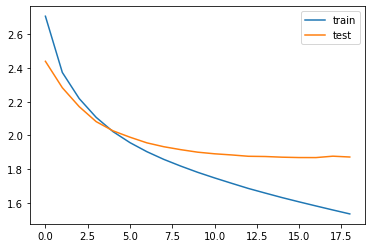

In [80]:
# 시각화
plt.plot(history.history['loss'], label='train')
plt.plot(history.history['val_loss'], label='test')
plt.legend()
plt.show()

In [81]:
# 정수 인덱스 행렬로 존재하던 데이터를 복원
src_index_to_word = src_tokenizer.index_word # 원문 단어 집합에서 정수 -> 단어를 얻음
tar_word_to_index = tar_tokenizer.word_index # 요약 단어 집합에서 단어 -> 정수를 얻음
tar_index_to_word = tar_tokenizer.index_word # 요약 단어 집합에서 정수 -> 단어를 얻음

In [82]:
# 인코더 설계
encoder_model = Model(inputs=encoder_inputs, outputs=[encoder_outputs, state_h, state_c])

In [83]:
# 이전 시점의 상태들을 저장하는 텐서
decoder_state_input_h = Input(shape=(hidden_size,))
decoder_state_input_c = Input(shape=(hidden_size,))

dec_emb2 = dec_emb_layer(decoder_inputs)

# 문장의 다음 단어를 예측하기 위해서 초기 상태(initial_state)를 이전 시점의 상태로 사용.
# 이는 뒤의 함수 decode_sequence()에 구현
# 훈련 과정에서와 달리 LSTM의 리턴하는 은닉 상태와 셀 상태인 state_h와 state_c를 버리지 않음.
decoder_outputs2, state_h2, state_c2 = decoder_lstm(dec_emb2, initial_state=[decoder_state_input_h, decoder_state_input_c])

# 어텐션 메커니즘을 사용하는 출력층을 설계
# 어텐션 함수
decoder_hidden_state_input = Input(shape=(text_max_len, hidden_size))
attn_out_inf = attn_layer([decoder_outputs2, decoder_hidden_state_input])
decoder_inf_concat = Concatenate(axis=-1, name='concat')([decoder_outputs2, attn_out_inf])

# 디코더의 출력층
decoder_outputs2 = decoder_softmax_layer(decoder_inf_concat)

# 최종 디코더 모델
decoder_model = Model(
    [decoder_inputs] + [decoder_hidden_state_input,decoder_state_input_h, decoder_state_input_c],
    [decoder_outputs2] + [state_h2, state_c2])

In [84]:
# 인퍼런스 단계에서 단어 시퀀스를 완성하는 함수
def decode_sequence(input_seq):
    # 입력으로부터 인코더의 상태를 얻음
    e_out, e_h, e_c = encoder_model.predict(input_seq)

     # <SOS>에 해당하는 토큰 생성
    target_seq = np.zeros((1,1))
    target_seq[0, 0] = tar_word_to_index['sostoken']

    stop_condition = False
    decoded_sentence = ''
    while not stop_condition: # stop_condition이 True가 될 때까지 루프 반복

        output_tokens, h, c = decoder_model.predict([target_seq] + [e_out, e_h, e_c])
        sampled_token_index = np.argmax(output_tokens[0, -1, :])
        sampled_token = tar_index_to_word[sampled_token_index]

        if (sampled_token!='eostoken'):
            decoded_sentence += ' '+sampled_token

        #  <eos>에 도달하거나 최대 길이를 넘으면 중단.
        if (sampled_token == 'eostoken'  or len(decoded_sentence.split()) >= (summary_max_len-1)):
            stop_condition = True

        # 길이가 1인 타겟 시퀀스를 업데이트
        target_seq = np.zeros((1,1))
        target_seq[0, 0] = sampled_token_index

        # 상태를 업데이트 합니다.
        e_h, e_c = h, c

    return decoded_sentence

# 원문의 정수 시퀀스를 텍스트 시퀀스로 변환
def seq2text(input_seq):
    temp=''
    for i in input_seq:
        if (i!=0):
            temp = temp + src_index_to_word[i]+' '
    return temp

# 요약문의 정수 시퀀스를 텍스트 시퀀스로 변환
def seq2summary(input_seq):
    temp = ''
    for i in input_seq:
        if (i == 0):
            continue
        if (i == tar_word_to_index['eostoken']):
            break
        if (i != tar_word_to_index['sostoken']):
            temp = temp + tar_index_to_word[i] + ' '
    return temp.strip()

In [85]:
# 요약문 출력
for i in range(50, 100):
    print("원문 :", seq2text(encoder_input_test[i]))
    print("실제 요약 :", seq2summary(decoder_input_test[i]))
    print("예측 요약 :", decode_sequence(encoder_input_test[i].reshape(1, text_max_len)))
    print("\n")

원문 : like find grinder bottle convenient like taste would definitely buy considering healthy use sure 
실제 요약 : sea salt
예측 요약 :  good stuff


원문 : gift friend sweet tooth always ate younger havent seen around years opened best gift would thought problem would share thanks great gift 
실제 요약 : mary
예측 요약 :  great gift


원문 : tried herbal tea family loved great aroma drink every day would recommend friends 
실제 요약 : mango and
예측 요약 :  great tea


원문 : heating boiling thorough job microwave goes great rice flat bread 
실제 요약 : mm tasty
예측 요약 :  great product


원문 : good sugar splenda equal muscles makes hard get bed morning problem supposed kind sugar 
실제 요약 : is good to me
예측 요약 :  good product


원문 : recommended vet alternative professional dental cleaning plaque build dog loves teeth look cleaner already month loves chew easy give one chews another rawhide variety 
실제 요약 : large dog chews
예측 요약 :  great for chewers


원문 : great growing amount sprouts tray full trays love 
실제 요약 : great sp

예측 요약 :  love this stuff


원문 : really enjoyed banana nut bread bar quaker oats put mine microwave seconds nice warm soft smells like fresh baked banana bread heat microwave nice banana packed flavor crunchy nuts top icing cake consistency banana bread healthier alternative take need pick box hand 
실제 요약 : delicious tastes like the real thing
예측 요약 :  great taste


원문 : husband bad scalp nothing made go away shampoo wash hair every day snow storm fan ingredients lot chemicals try chemicals anything since works well continue use less frequently 
실제 요약 : actually works
예측 요약 :  not bad


원문 : like dried peas tomatoes also like corn way expensive though really handy use frozen canned foods follow diet find fresh peas use probably without cannot afford bad 
실제 요약 : very good but too expensive
예측 요약 :  great product


원문 : great choice cup coffee great flavor kups tried sampler packs one stands great kup time day cuisinart years fresh ground beans easy kurig taste superior 
실제 요약 : tully it